<a href="https://colab.research.google.com/github/sakshamjn/Omdena-OVAC/blob/main/news_paper_analytics_part_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_csv('/content/Reviewed_File_all_english.csv', encoding = "cp437")

In [ ]:
data.head()

,Unnamed: 0,OVAC,PVAC,Country,Date,Title,Article_Link,Article,Summary,Keywords,Language,Tag
0,0,0.0,1,Finland,9.1.2020,Appeal court upholds guilty verdict in Oulu ch...,https://yle.fi/uutiset/11150396,The Rovaniemi Court of Appeal has upheld the c...,NaN,NaN,English,PVAC
1,1,0.0,1,Finland,15.5.2019,Mikkeli man convicted in child sexual abuse case,https://yle.fi/uutiset/10783816,The defendant in the case was convicted and se...,NaN,NaN,English,PVAC
2,2,1.0,1,Finland,7.6.2019,Court hands down 40-month prison sentence in 4...,https://yle.fi/uutiset/10820884,The Oulu district court has convicted a 29-yea...,NaN,NaN,English,mixed
3,3,0.0,1,Finland,3.1.2019,Southern Finland coach in custody on suspicion...,https://yle.fi/uutiset/10579990,"The coach of a sports club in HyvinkΣΣ, southe...",NaN,NaN,English,PVAC
4,4,1.0,0,Finland,20.9.2019,Ex-church councillor among four charged in vio...,https://yle.fi/uutiset/10981177,"Authorities in Ostrobothnia, western Finland h...",NaN,NaN,English,OVAC


In [ ]:
data.describe()

,Unnamed: 0,OVAC
count,2836.000000,2814.000000
mean,1417.500000,0.568941
std,818.827007,0.495312
min,0.000000,0.000000
25%,708.750000,0.000000
50%,1417.500000,1.000000
75%,2126.250000,1.000000
max,2835.000000,1.000000


Violence Distribution based on Country


In [ ]:
data.head()

,Unnamed: 0,OVAC,PVAC,Country,Date,Title,Article_Link,Article,Summary,Keywords,Language,Tag
0,0,0.0,1,Finland,9.1.2020,Appeal court upholds guilty verdict in Oulu ch...,https://yle.fi/uutiset/11150396,The Rovaniemi Court of Appeal has upheld the c...,NaN,NaN,English,PVAC
1,1,0.0,1,Finland,15.5.2019,Mikkeli man convicted in child sexual abuse case,https://yle.fi/uutiset/10783816,The defendant in the case was convicted and se...,NaN,NaN,English,PVAC
2,2,1.0,1,Finland,7.6.2019,Court hands down 40-month prison sentence in 4...,https://yle.fi/uutiset/10820884,The Oulu district court has convicted a 29-yea...,NaN,NaN,English,mixed
3,3,0.0,1,Finland,3.1.2019,Southern Finland coach in custody on suspicion...,https://yle.fi/uutiset/10579990,"The coach of a sports club in HyvinkΣΣ, southe...",NaN,NaN,English,PVAC
4,4,1.0,0,Finland,20.9.2019,Ex-church councillor among four charged in vio...,https://yle.fi/uutiset/10981177,"Authorities in Ostrobothnia, western Finland h...",NaN,NaN,English,OVAC


## Word Cloud


In [ ]:
content_articles = data['Article']

In [ ]:
content_articles

0       The Rovaniemi Court of Appeal has upheld the c...
1       The defendant in the case was convicted and se...
2       The Oulu district court has convicted a 29-yea...
3       The coach of a sports club in HyvinkΣΣ, southe...
4       Authorities in Ostrobothnia, western Finland h...
                              ...                        
2831    A convicted child sex offender used gardening ...
2832    A 17-year-old boy has been charged with 25 chi...
2833    A Catholic priest has been jailed for nine yea...
2834    Two men who sexually abused two 14-year-old gi...
2835    Sheffield City Council is "turning a blind eye...
Name: Article, Length: 2836, dtype: object

In [ ]:
all_texts = ''
for text in content_articles:
  all_texts += str(text)

In [ ]:
all_texts

'The Rovaniemi Court of Appeal has upheld the conviction by Oulu District Court of a 30-year-old man for the sexual abuse of a 13-year-old girl. The court sentenced the defendant, Javad Mirzad, to three years and four months in prison after he was found guilty of aggravated child sexual abuse by the district court last summer.  The appeal court confirmed the man\'s guilty verdict on the charges brought against him. However, the court halved the amount of damages the defendant was ordered to pay the victim - down a total of 1,500 euros. The appeal hearing was linked to a series of similar cases in which a 13-year-old girl was believed to have suffered abuse at the hands of eight foreign-background men between June and October of 2018. The court found that the offences involving the defendant occurred at a private residence in the Oulu region August 2018 and that the victim and the defendant had been in contact via a messaging service. All of the defendants involved had arrived in the co

In [ ]:
len(all_texts)

10450576

In [ ]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 

wordcloud = WordCloud().generate(all_texts)

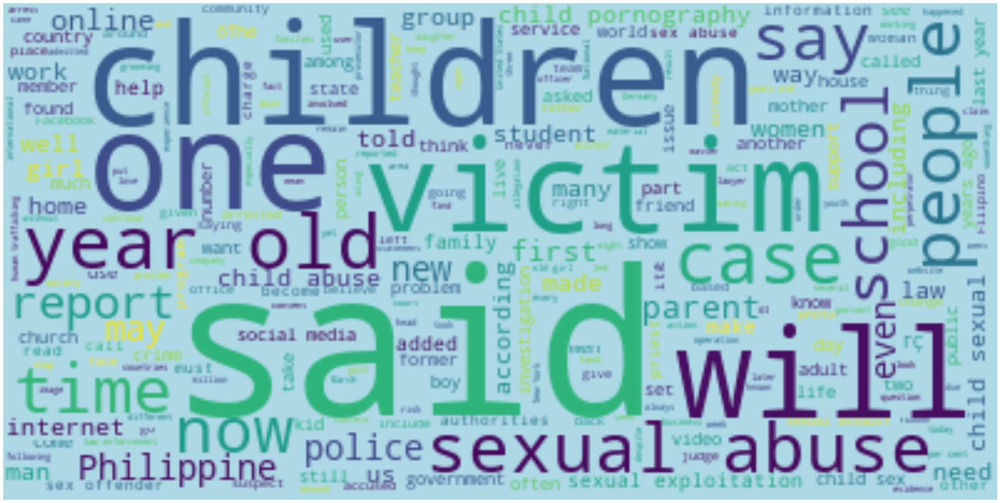

In [ ]:
wc = WordCloud(background_color="lightblue", max_words=1000,
               contour_width=3, contour_color='yellow')     

wc.generate(all_texts)

wc.to_file("content_articles.png")

plt.figure(figsize=[40,20])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
# Shows inconsistency in Date Formats.
data['Date']

0                  9.1.2020
1                 15.5.2019
2                  7.6.2019
3                  3.1.2019
4                 20.9.2019
               ...         
2831    2018-02-27 00:00:00
2832    2018-02-27 00:00:00
2833    2018-04-11 00:00:00
2834    2018-02-22 00:00:00
2835    2018-04-09 00:00:00
Name: Date, Length: 2836, dtype: object

In [ ]:
data['Date'] = pd.to_datetime(data['Date'], errors='coerce')

/usr/local/lib/python3.6/dist-packages/dateutil/parser/_parser.py:1218: UnknownTimezoneWarning: tzname PST identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.
  category=UnknownTimezoneWarning)


In [ ]:
data['Date']

0       2020-09-01 00:00:00
1       2019-05-15 00:00:00
2       2019-07-06 00:00:00
3       2019-03-01 00:00:00
4       2019-09-20 00:00:00
               ...         
2831    2018-02-27 00:00:00
2832    2018-02-27 00:00:00
2833    2018-04-11 00:00:00
2834    2018-02-22 00:00:00
2835    2018-04-09 00:00:00
Name: Date, Length: 2836, dtype: object

In [ ]:
data['Date'].isna().sum()

621

In [ ]:
data.head()

,Unnamed: 0,OVAC,PVAC,Country,Date,Title,Article_Link,Article,Summary,Keywords,Language,Tag
0,0,0.0,1,Finland,2020-09-01 00:00:00,Appeal court upholds guilty verdict in Oulu ch...,https://yle.fi/uutiset/11150396,The Rovaniemi Court of Appeal has upheld the c...,NaN,NaN,English,PVAC
1,1,0.0,1,Finland,2019-05-15 00:00:00,Mikkeli man convicted in child sexual abuse case,https://yle.fi/uutiset/10783816,The defendant in the case was convicted and se...,NaN,NaN,English,PVAC
2,2,1.0,1,Finland,2019-07-06 00:00:00,Court hands down 40-month prison sentence in 4...,https://yle.fi/uutiset/10820884,The Oulu district court has convicted a 29-yea...,NaN,NaN,English,mixed
3,3,0.0,1,Finland,2019-03-01 00:00:00,Southern Finland coach in custody on suspicion...,https://yle.fi/uutiset/10579990,"The coach of a sports club in HyvinkΣΣ, southe...",NaN,NaN,English,PVAC
4,4,1.0,0,Finland,2019-09-20 00:00:00,Ex-church councillor among four charged in vio...,https://yle.fi/uutiset/10981177,"Authorities in Ostrobothnia, western Finland h...",NaN,NaN,English,OVAC


In [ ]:
df_with_dates = data.copy()

In [ ]:
df_with_dates.head()

,Unnamed: 0,OVAC,PVAC,Country,Date,Title,Article_Link,Article,Summary,Keywords,Language,Tag
0,0,0.0,1,Finland,2020-09-01 00:00:00,Appeal court upholds guilty verdict in Oulu ch...,https://yle.fi/uutiset/11150396,The Rovaniemi Court of Appeal has upheld the c...,NaN,NaN,English,PVAC
1,1,0.0,1,Finland,2019-05-15 00:00:00,Mikkeli man convicted in child sexual abuse case,https://yle.fi/uutiset/10783816,The defendant in the case was convicted and se...,NaN,NaN,English,PVAC
2,2,1.0,1,Finland,2019-07-06 00:00:00,Court hands down 40-month prison sentence in 4...,https://yle.fi/uutiset/10820884,The Oulu district court has convicted a 29-yea...,NaN,NaN,English,mixed
3,3,0.0,1,Finland,2019-03-01 00:00:00,Southern Finland coach in custody on suspicion...,https://yle.fi/uutiset/10579990,"The coach of a sports club in HyvinkΣΣ, southe...",NaN,NaN,English,PVAC
4,4,1.0,0,Finland,2019-09-20 00:00:00,Ex-church councillor among four charged in vio...,https://yle.fi/uutiset/10981177,"Authorities in Ostrobothnia, western Finland h...",NaN,NaN,English,OVAC


In [ ]:
df_with_dates['Date']

0       2020-09-01 00:00:00
1       2019-05-15 00:00:00
2       2019-07-06 00:00:00
3       2019-03-01 00:00:00
4       2019-09-20 00:00:00
               ...         
2831    2018-02-27 00:00:00
2832    2018-02-27 00:00:00
2833    2018-04-11 00:00:00
2834    2018-02-22 00:00:00
2835    2018-04-09 00:00:00
Name: Date, Length: 2836, dtype: object

In [ ]:
df_with_dates['Date'].isnull().sum()

621

In [ ]:
df_with_dates.dropna(subset = ['Date'], inplace = True)

In [ ]:
df_with_dates['Date'].isnull().sum()

0

In [ ]:
data.to_csv('all_articles.csv')

In [ ]:
df_with_dates.to_csv('articles_with_date.csv')

In [ ]:
data1 = pd.read_csv('/content/articles_with_date.csv', encoding = "cp437")

In [ ]:
data1

,Unnamed: 0,Unnamed: 0.1,OVAC,PVAC,Country,Date,Title,Article_Link,Article,Summary,Keywords,Language,Tag
0,0,0,0.0,1,Finland,2020-09-01 00:00:00,Appeal court upholds guilty verdict in Oulu ch...,https://yle.fi/uutiset/11150396,The Rovaniemi Court of Appeal has upheld the c...,NaN,NaN,English,PVAC
1,1,1,0.0,1,Finland,2019-05-15 00:00:00,Mikkeli man convicted in child sexual abuse case,https://yle.fi/uutiset/10783816,The defendant in the case was convicted and se...,NaN,NaN,English,PVAC
2,2,2,1.0,1,Finland,2019-07-06 00:00:00,Court hands down 40-month prison sentence in 4...,https://yle.fi/uutiset/10820884,The Oulu district court has convicted a 29-yea...,NaN,NaN,English,mixed
3,3,3,0.0,1,Finland,2019-03-01 00:00:00,Southern Finland coach in custody on suspicion...,https://yle.fi/uutiset/10579990,"The coach of a sports club in Hyvink╬ú╬ú, sout...",NaN,NaN,English,PVAC
4,4,4,1.0,0,Finland,2019-09-20 00:00:00,Ex-church councillor among four charged in vio...,https://yle.fi/uutiset/10981177,"Authorities in Ostrobothnia, western Finland h...",NaN,NaN,English,OVAC
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2210,2831,2831,1.0,0,UK,2018-02-27 00:00:00,Child sex offender scaled prison wall at HMP P...,http://www.bbc.co.uk/news/uk-england-cambridge...,A convicted child sex offender used gardening ...,NaN,NaN,English,OVAC
2211,2832,2832,1.0,0,UK,2018-02-27 00:00:00,"Warrington teenager, 17, charged with 25 child...",http://www.bbc.co.uk/news/uk-england-merseysid...,A 17-year-old boy has been charged with 25 chi...,NaN,NaN,English,OVAC
2212,2833,2833,1.0,0,UK,2018-04-11 00:00:00,Catholic priest jailed for nine years for chil...,http://www.bbc.co.uk/news/uk-scotland-glasgow-...,A Catholic priest has been jailed for nine yea...,NaN,NaN,English,OVAC
2213,2834,2834,1.0,0,UK,2018-02-22 00:00:00,Child sex offenders jailed after appeal by Sol...,http://www.bbc.co.uk/news/uk-england-devon-431...,Two men who sexually abused two 14-year-old gi...,NaN,NaN,English,OVAC


In [ ]:
df_with_dates['Date'] = pd.to_datetime(df_with_dates['Date'], errors='coerce', utc = True)

In [ ]:
df_with_dates['Date'] = pd.to_datetime(df_with_dates['Date'])
#yearly = df_with_dates.resample("Y").count()

In [ ]:
yearly = df_with_dates.resample('Y', on='Date').sum()

In [ ]:
yearly

,Unnamed: 0,OVAC
Date,,
2004-12-31 00:00:00+00:00,172,2.0
2005-12-31 00:00:00+00:00,1348,6.0
2006-12-31 00:00:00+00:00,1039,4.0
2007-12-31 00:00:00+00:00,592,4.0
2008-12-31 00:00:00+00:00,1817,9.0
2009-12-31 00:00:00+00:00,801,7.0
2010-12-31 00:00:00+00:00,4831,5.0
2011-12-31 00:00:00+00:00,70457,29.0
2012-12-31 00:00:00+00:00,91671,24.0


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


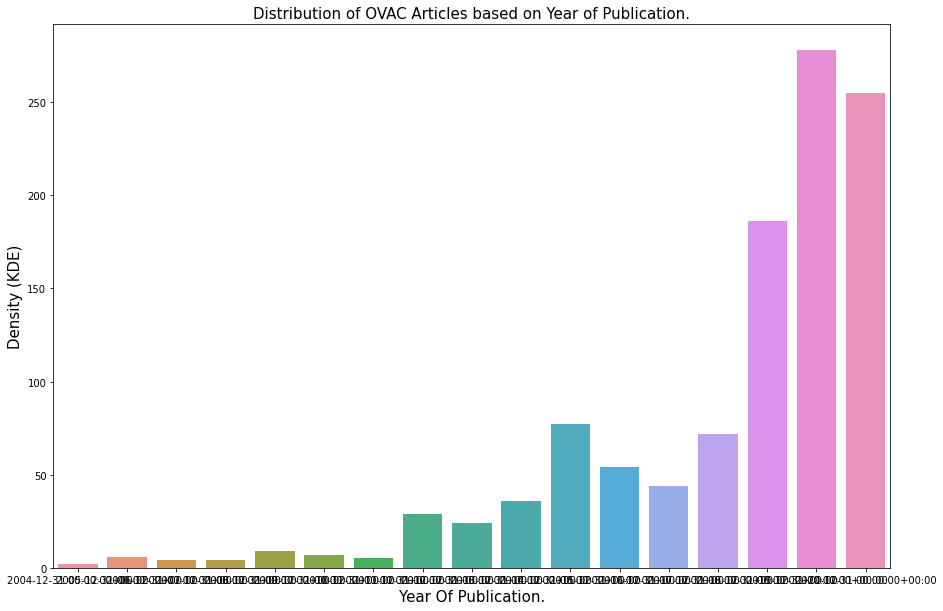

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
sns.barplot(yearly.index,yearly.OVAC)
ax.set_title('Distribution of OVAC Articles based on Year of Publication.', fontsize= 15)
plt.ylabel("Density (KDE)", fontsize= 15)
plt.xlabel("Year Of Publication.", fontsize= 15)
plt.show()

In [ ]:
!pip install dtale

     |████████████████████████████████| 7.7MB 3.7MB/s 
     |████████████████████████████████| 194kB 42.2MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
     |████████████████████████████████| 81kB 8.2MB/s 
     |████████████████████████████████| 71kB 8.3MB/s 
     |████████████████████████████████| 1.8MB 43.1MB/s 
     |████████████████████████████████| 645kB 41.8MB/s 
     |████████████████████████████████| 358kB 43.0MB/s 
     |████████████████████████████████| 1.0MB 43.4MB/s 
     |████████████████████████████████| 3.5MB 17.0MB/s 
     |████████████████████████████████| 194kB 45.4MB/s 
     |████████████████████████████████| 1.8MB 41.3MB/s 
  Created wheel for Flask-Compress: filename=Flask_Compress-1.7.0-cp36-none-any.whl size=6833 sha256=1f41202cacfbd305a4ffab26a2b07ffd338339418b0e3408089a5f4033060607
  Stored in directory: /root/.cache/pip/wheels/1d/b7/18/2b88ed33c5ef53868d1bfb0d3f2f351ae0143414734415bd06
  Created wheel for dash: filename=dash-1.17.0-cp36-none-any.w

In [ ]:
import dtale

In [ ]:
dtale.show(df_with_dates)

It looks like this data may have already been loaded to D-Tale based on shape and column names. Here is URL of the data that seems to match it:

http://c22512f7f3e2:40000/dtale/main/1

If you still want to load this data please use the following command:

dtale.show(df, ignore_duplicate=True)
